# Импортируем библиотеки

In [ ]:
!pip install dtreeviz

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import sklearn
from itertools import combinations

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_curve, confusion_matrix, auc, classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

import matplotlib.pyplot as plt
import matplotlib.font_manager

import dtreeviz
import graphviz

from mpl_toolkits.mplot3d import Axes3D
from IPython.display import clear_output

from mlxtend.plotting import plot_decision_regions

%config InlineBackend.figure_format = 'retina'


# Грузим данные

In [ ]:
# Сразу посмотрим на данные
apples = pd.read_csv('https://raw.githubusercontent.com/ElijahSum/mipt_visualization/master/week_03_visualization/apple_quality.csv')
apples.head()

,A_id,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity,Quality
0,0.0,-3.970049,-2.512336,5.346330,-1.012009,1.844900,0.329840,-0.491590483,good
1,1.0,-1.195217,-2.839257,3.664059,1.588232,0.853286,0.867530,-0.722809367,good
2,2.0,-0.292024,-1.351282,-1.738429,-0.342616,2.838636,-0.038033,2.621636473,bad
3,3.0,-0.657196,-2.271627,1.324874,-0.097875,3.637970,-3.413761,0.790723217,good
4,4.0,1.364217,-1.296612,-0.384658,-0.553006,3.030874,-1.303849,0.501984036,good


Выглядит нормально, но сразу отмечаем про себя, что соболбец A_id это просто индекс, а столбец Quality категориальный, не все алгоритмы и графики его воспримут, нужно будет перекодировать

In [ ]:
# создадим копию и работать будем уже с ней - хорошая привычка
df = apples.copy()

In [ ]:
# подробный EDA проводит не будем, но кое что нужно посмотреть обязательно
df.isnull().sum()

A_id           1
Size           1
Weight         1
Sweetness      1
Crunchiness    1
Juiciness      1
Ripeness       1
Acidity        0
Quality        1
dtype: int64

In [ ]:
# Выборка строк с хотя бы одним нулевым значением
rows_with_null = df[df.isnull().any(axis=1)]

# Вывод строк с нулевыми значениями
rows_with_null


,A_id,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity,Quality
4000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Created_by_Nidula_Elgiriyewithana,NaN


Хм, похоже последняя строка с подписью затесалась в данные, нужно ее удалдить

In [ ]:
# Удаление строк с нулевыми значениями
df = df.dropna()

In [ ]:
df.isnull().sum()

A_id           0
Size           0
Weight         0
Sweetness      0
Crunchiness    0
Juiciness      0
Ripeness       0
Acidity        0
Quality        0
dtype: int64

Вот теперь все хорошо

In [ ]:
# пора приступать к кодированию категиальной переменной
# Просмотр уникальных значений в столбце 'Quality'
unique_values = df['Quality'].unique()
print("Уникальные значения в столбце 'Quality':", unique_values)

# Создание словаря для перекодировки
encoding_map = {'good': 1, 'bad' : 0}
print("Словарь для перекодировки:", encoding_map)

# Перекодировка столбца 'Quality'
df['Quality_Encoded'] = df['Quality'].map(encoding_map)
df[['Quality', 'Quality_Encoded']].head()


Уникальные значения в столбце 'Quality': ['good' 'bad']
Словарь для перекодировки: {'good': 1, 'bad': 0}


<ipython-input-10-bd5d37c279a5>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,Quality,Quality_Encoded
0,good,1
1,good,1
2,bad,0
3,good,1
4,good,1


Если перекодировать наоборот то лучший результат будет хуже на несколько сотых, интересно почему, вообще как бы говорили что порядок значений при маппинге не важен, это не правда, алгоритму надо помогать и маппить нужно вдумчево, качество от этого зависит

# Задача 1.

Сравнение качества работы kNN при разных параметрах k
На лекциях и семинарах мы разбирали возможности для применения стандартных библиотек при работе с алгоритмом kNN. Мы также обращали внимание, что существует большое количество кастомных библиотек для создания более тонкой и кастомной визуализации. Одна из них — библиотека mlxtend.plotting.

Эта библиотека позволяет создавать удобные визуализации работы алгоритмов машинного обучения. В ней есть функция plot_decision_regions, которая позволяет создавать визуализации для алгоритмов классификации.


In [ ]:
# можно перекодировать и так, скалерн как правило умнее
le = LabelEncoder()
df['Quality_Encoded'] = le.fit_transform(df['Quality'])  # Перекодировка целевой переменной

X = df.drop(['Quality', 'Quality_Encoded', 'A_id'], axis=1)  # Признаки
y = df['Quality_Encoded']  # Целевая переменная

# Разделение данных на обучающий и тестовый наборы
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
# перед решением задач проверим KNN на всех данных
for i in [1, 2, 5, 10, 20, 30]:
    # Обучение модели KNN
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train, y_train)

    # Предсказание на тестовом наборе
    y_pred = knn.predict(X_test)

    # Вывод метрик классификации
    print(f'Метрики классификации для k= {i}:')
    print(classification_report(y_test, y_pred))

Метрики классификации для k= 1:
              precision    recall  f1-score   support

           0       0.91      0.88      0.90       401
           1       0.89      0.92      0.90       399

    accuracy                           0.90       800
   macro avg       0.90      0.90      0.90       800
weighted avg       0.90      0.90      0.90       800

Метрики классификации для k= 2:
              precision    recall  f1-score   support

           0       0.81      0.92      0.87       401
           1       0.91      0.79      0.85       399

    accuracy                           0.86       800
   macro avg       0.86      0.86      0.86       800
weighted avg       0.86      0.86      0.86       800

Метрики классификации для k= 5:
              precision    recall  f1-score   support

           0       0.91      0.89      0.90       401
           1       0.89      0.91      0.90       399

    accuracy                           0.90       800
   macro avg       0.90      0.9

Интересно - лучшая точность на 20 ближайших соседях

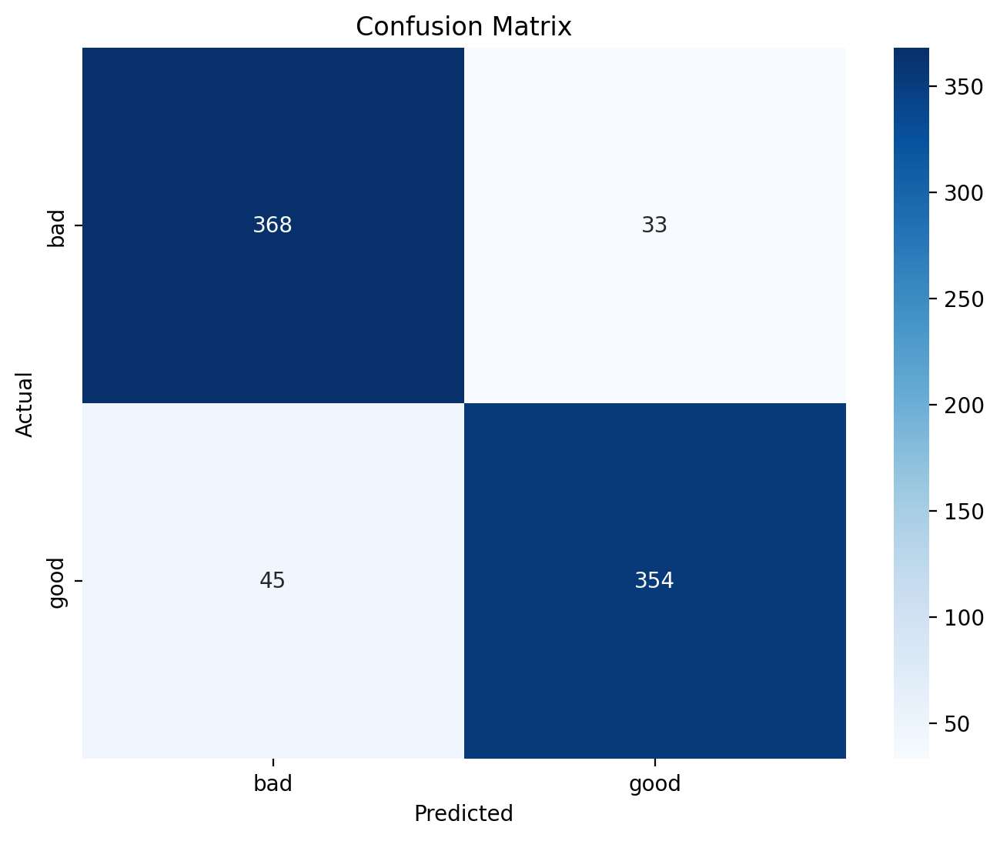

In [ ]:
# Вычисление матрицы ошибок
cm = confusion_matrix(y_test, y_pred)

# Визуализация матрицы ошибок
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


## Задача 1.1 (2 балла)

Напишите функцию, которая будет:
Отбирать все числовые признаки в датасете.
Перебирать все сочетания по два признака (без повторений) и запускать для каждой пары признаков алгоритм kNN (с k = 10). Для каждой итерации необходимо считать accuracy. Зависимая переменная  указывается отдельно при подаче в функцию.
Возвращает названия двух признаков, которые дали наибольший accuracy score. Если accuracy score совпадают для двух или нескольких пар, верните первую найденную вами пару.
Прототип может выглядеть примерно так:

In [ ]:
def knn_two_features(df, y):
    # Отбираем все числовые признаки, за исключением 'A_id' и Quality_Encoded по понятным причинам, это таргет а не метрика
    #numeric_features = df.select_dtypes(include=['float64', 'int64']).columns.drop(['A_id', 'Quality_Encoded'])
    numeric_features = df.select_dtypes(include='number').columns.drop(['A_id', 'Quality_Encoded'])


    # Перебираем все сочетания по два признака
    best_accuracy = 0
    best_features = None
    for feat1, feat2 in combinations(numeric_features, 2):
        # Подготовка данных для обучения
        X = df[[feat1, feat2]]
        X_train, X_test, y_train, y_test = train_test_split(X, df[y], test_size=0.2, random_state=42)

        # Обучение модели kNN с k=10
        knn = KNeighborsClassifier(n_neighbors=10)
        knn.fit(X_train, y_train)

        # Получение предсказаний и расчет accuracy
        y_pred = knn.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)

        # Обновление лучшего результата, если текущий лучше предыдущего
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_features = [feat1, feat2]

        # Вывод результатов для текущей комбинации
        print(f"Признаки: {feat1}, {feat2}, Accuracy: {accuracy}")

    return best_features, best_accuracy

In [ ]:
# Получим сочетние 2-х лучших признаков
best_features, best_accuracy = knn_two_features(df, 'Quality')
print('\n')
print("Лучшие признаки:", best_features)
print("Лучший результат accuracy:", best_accuracy)

Признаки: Size, Weight, Accuracy: 0.62
Признаки: Size, Sweetness, Accuracy: 0.64875
Признаки: Size, Crunchiness, Accuracy: 0.62375
Признаки: Size, Juiciness, Accuracy: 0.65125
Признаки: Size, Ripeness, Accuracy: 0.6325
Признаки: Weight, Sweetness, Accuracy: 0.6025
Признаки: Weight, Crunchiness, Accuracy: 0.5975
Признаки: Weight, Juiciness, Accuracy: 0.6175
Признаки: Weight, Ripeness, Accuracy: 0.60125
Признаки: Sweetness, Crunchiness, Accuracy: 0.62125
Признаки: Sweetness, Juiciness, Accuracy: 0.61
Признаки: Sweetness, Ripeness, Accuracy: 0.65625
Признаки: Crunchiness, Juiciness, Accuracy: 0.63
Признаки: Crunchiness, Ripeness, Accuracy: 0.61375
Признаки: Juiciness, Ripeness, Accuracy: 0.68


Лучшие признаки: ['Juiciness', 'Ripeness']
Лучший результат accuracy: 0.68


In [ ]:
# всегда проверяю а не лучше ли когда y - числа, всегда перепроверяю
best_features, best_accuracy = knn_two_features(df, 'Quality_Encoded')
print('\n')
print("Лучшие признаки:", best_features)
print("Лучший результат accuracy:", best_accuracy)

Признаки: Size, Weight, Accuracy: 0.62
Признаки: Size, Sweetness, Accuracy: 0.64875
Признаки: Size, Crunchiness, Accuracy: 0.62375
Признаки: Size, Juiciness, Accuracy: 0.65125
Признаки: Size, Ripeness, Accuracy: 0.6325
Признаки: Weight, Sweetness, Accuracy: 0.6025
Признаки: Weight, Crunchiness, Accuracy: 0.5975
Признаки: Weight, Juiciness, Accuracy: 0.6175
Признаки: Weight, Ripeness, Accuracy: 0.60125
Признаки: Sweetness, Crunchiness, Accuracy: 0.62125
Признаки: Sweetness, Juiciness, Accuracy: 0.61
Признаки: Sweetness, Ripeness, Accuracy: 0.65625
Признаки: Crunchiness, Juiciness, Accuracy: 0.63
Признаки: Crunchiness, Ripeness, Accuracy: 0.61375
Признаки: Juiciness, Ripeness, Accuracy: 0.68


Лучшие признаки: ['Juiciness', 'Ripeness']
Лучший результат accuracy: 0.68


Результат аналогичный, это значит KNN спокойно работает с категориальными таргетами, честь ему за это и хвала

## Задача 1.2 (2 балла)

Мы получили два признака, которые вместе дают наибольший accuracy score. Теперь покрутите их, одновременно изменяя параметр k. С помощью plot_decision_regions библиотеки mlxtend.plotting постройте поле 3х3 из визуализаций результатов работы алгоритма kNN с разными параметрами k. Параметры k можно взять следующие: 1, 2, 5, 10, 15, 20, 30, 40, 50.

Подробнее о том, как работать с этой функцией, можно почитать в инструкции. Там же есть информация, как создать поле размером 3х3 для построения графиков.

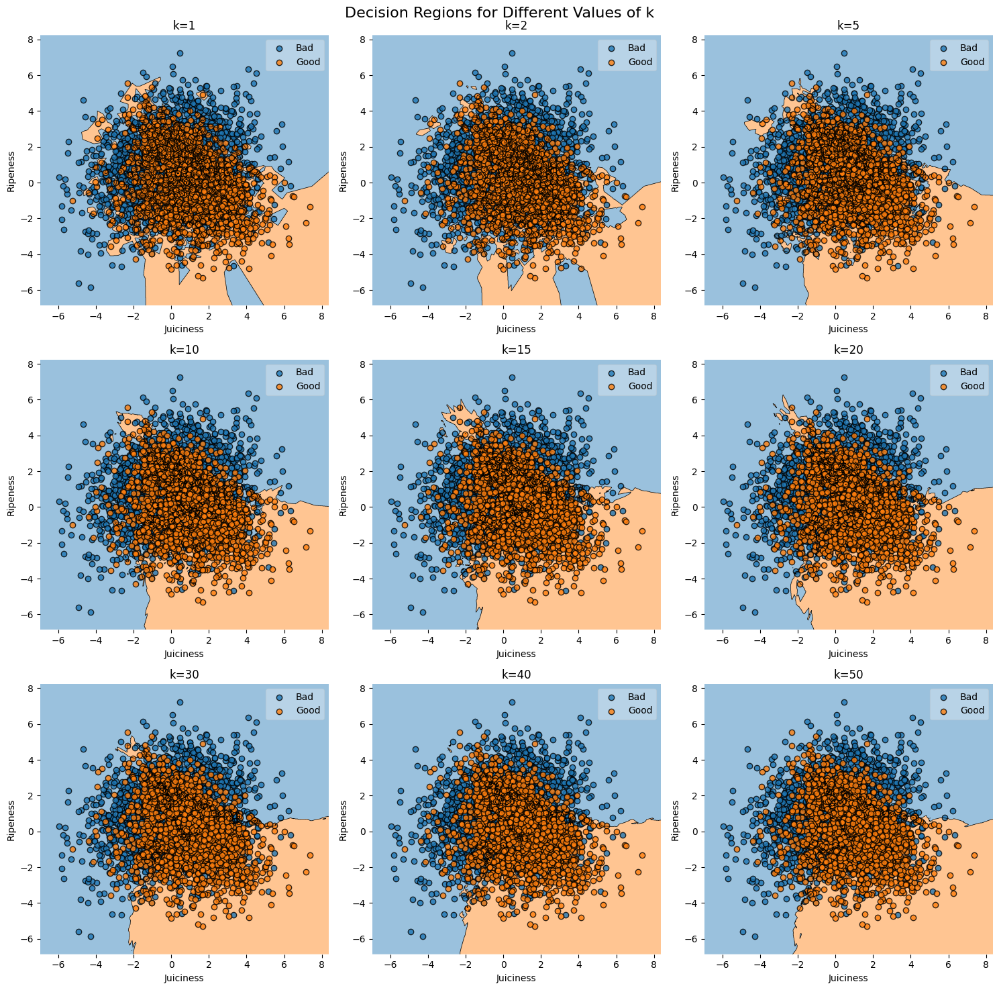

In [ ]:
def visualize_knn(df, best_features, y, ks):

    # Разделение данных на обучающий набор и тестовый набор
    X_train, _, y_train, _ = train_test_split(df[best_features].values, df[y].values, test_size=0.2, random_state=42)
    # Создание сетки графиков
    fig, axs = plt.subplots(3, 3, figsize=(15, 15))

    # Перебор всех комбинаций значений k и осей графиков
    for i, k in enumerate(ks):
        # Определение индексов осей графиков
        row = i // 3
        col = i % 3

        # Обучение модели kNN
        knn = KNeighborsClassifier(n_neighbors=k)
        knn.fit(X_train, y_train)

        # Визуализация результатов
        ax = plot_decision_regions(X=df[best_features].values, y=df[y].values, clf=knn, ax=axs[row, col], legend=0, markers='o', colors='#1f77b4,#ff7f0e', feature_index=[0, 1], scatter_kwargs={'alpha': 0.8})
        axs[row, col].set_title(f"k={k}")
        axs[row, col].set_xlabel(best_features[0])
        axs[row, col].set_ylabel(best_features[1])

        # Добавление собственных меток легенды
        handles, labels = ax.get_legend_handles_labels()
        ax.legend(handles,
                  ['Bad', 'Good'],
                  framealpha=0.3, scatterpoints=1)

    # Установка общего заголовка для всей сетки графиков
    plt.suptitle("Decision Regions for Different Values of k", fontsize=16)
    plt.tight_layout()
    plt.show()

# Задание значений параметра k
ks = [1, 2, 5, 10, 15, 20, 30, 40, 50]

# Вызов функции для визуализации результатов
visualize_knn(df, best_features, 'Quality_Encoded', ks)


## Задача 1.3 (1 балл)

Функция plot_decision_regions удобна тем, что ее можно использовать для визуализации разных алгоритмов классификации.

Выберите два параметра, которые кажутся вам наиболее важными при оценке качества яблок. Используйте их, чтобы построить алгоритм решающего дерева.
Также постройте решающее дерево для признаков, которые были отобраны в пункте 1.1.
Создайте поле 1х2 и визуализируйте полученные результаты. Каждый график озаглавьте.

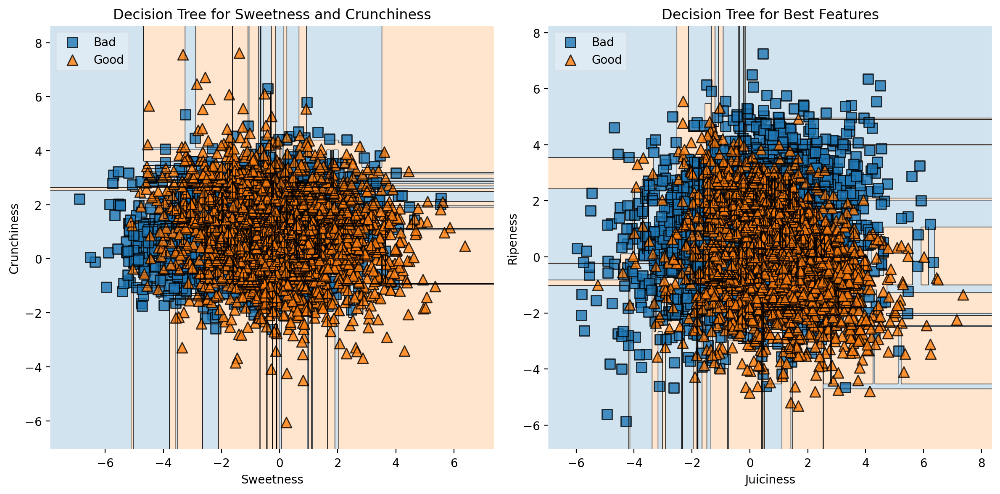

In [ ]:
# Создание решающего дерева для параметров "Sweetness" и "Crunchiness"
X_sweet_crunch = df[['Sweetness', 'Crunchiness']].values
y = df['Quality_Encoded'].values
dt_sweet_crunch = DecisionTreeClassifier()
dt_sweet_crunch.fit(X_sweet_crunch, y)

# Создание решающего дерева для лучших признаков
X_best_features = df[best_features].values
dt_best_features = DecisionTreeClassifier()
dt_best_features.fit(X_best_features, y)

# Создание поля 1x2 для визуализации результатов
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

# Визуализация решающего дерева для параметров "Sweetness" и "Crunchiness"
plot_decision_regions(X=X_sweet_crunch, y=y, clf=dt_sweet_crunch, ax=axs[0], legend=2,
                       scatter_kwargs={'alpha': 0.8, 's': 80}, contourf_kwargs={'alpha': 0.2},
                       scatter_highlight_kwargs={'s': 80}, markers='s^')
axs[0].set_title("Decision Tree for Sweetness and Crunchiness")
axs[0].set_xlabel("Sweetness")
axs[0].set_ylabel("Crunchiness")
# Добавление собственных меток легенды
handles, labels = axs[0].get_legend_handles_labels()
axs[0].legend(handles,
              ['Bad', 'Good'],
              loc='upper left', framealpha=0.3, scatterpoints=1)

# Визуализация решающего дерева для лучших признаков
plot_decision_regions(X=X_best_features, y=y, clf=dt_best_features, ax=axs[1], legend=2,
                       scatter_kwargs={'alpha': 0.8, 's': 80}, contourf_kwargs={'alpha': 0.2},
                       scatter_highlight_kwargs={'s': 80}, markers='s^')
axs[1].set_title("Decision Tree for Best Features")
axs[1].set_xlabel(best_features[0])
axs[1].set_ylabel(best_features[1])
# Добавление собственных меток легенды
handles, labels = axs[1].get_legend_handles_labels()
axs[1].legend(handles,
              ['Bad', 'Good'],
              loc='upper left', framealpha=0.3, scatterpoints=1)

plt.tight_layout()
plt.show()


# Задача 2. Визуализация алгоритмов решающего дерева

## Задача 2.1 (1 балл)

Аналогично пункту 1.1, создайте две функции для алгоритмов решающего дерева:

Функцию, которая возвращает два параметра, дающие наибольший accuracy score при применении алгоритма решающего дерева.
Такую же функцию, но которая возвращает три параметра (то есть перебирает все значения не по парам признаков, а по тройкам).

In [ ]:
def decision_tree_two_features(df, y):
    # Отбираем все числовые признаки, за исключением 'A_id' и целевой переменной
    numeric_features = df.select_dtypes(include='number').columns.drop(['A_id', y])

    best_accuracy_two = 0
    best_features_two = None

    for feat1, feat2 in combinations(numeric_features, 2):
        X = df[[feat1, feat2]]
        X_train, X_test, y_train, y_test = train_test_split(X, df[y], test_size=0.2, random_state=42)

        dt = DecisionTreeClassifier()
        dt.fit(X_train, y_train)

        y_pred = dt.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)

        if accuracy > best_accuracy_two:
            best_accuracy_two = accuracy
            best_features_two = [feat1, feat2]

        print(f"Features: {feat1}, {feat2}, Accuracy: {accuracy}")

    return best_features_two, best_accuracy_two


In [ ]:
best_features_two, best_accuracy_two = decision_tree_two_features(df, 'Quality_Encoded')
print('\n')
print("Best features:", best_features_two)
print("Best accuracy:", best_accuracy_two)

Features: Size, Weight, Accuracy: 0.57125
Features: Size, Sweetness, Accuracy: 0.59375
Features: Size, Crunchiness, Accuracy: 0.5725
Features: Size, Juiciness, Accuracy: 0.58375
Features: Size, Ripeness, Accuracy: 0.62125
Features: Weight, Sweetness, Accuracy: 0.575
Features: Weight, Crunchiness, Accuracy: 0.57375
Features: Weight, Juiciness, Accuracy: 0.56875
Features: Weight, Ripeness, Accuracy: 0.555
Features: Sweetness, Crunchiness, Accuracy: 0.57625
Features: Sweetness, Juiciness, Accuracy: 0.5725
Features: Sweetness, Ripeness, Accuracy: 0.59375
Features: Crunchiness, Juiciness, Accuracy: 0.6
Features: Crunchiness, Ripeness, Accuracy: 0.55625
Features: Juiciness, Ripeness, Accuracy: 0.6075


Best features: ['Size', 'Ripeness']
Best accuracy: 0.62125


In [ ]:
def decision_tree_three_features(df, y):
    numeric_features = df.select_dtypes(include='number').columns.drop(['A_id', y])

    best_accuracy_three = 0
    best_features_three = None

    for feat1, feat2, feat3 in combinations(numeric_features, 3):
        X = df[[feat1, feat2, feat3]]
        X_train, X_test, y_train, y_test = train_test_split(X, df[y], test_size=0.2, random_state=42)

        dt = DecisionTreeClassifier()
        dt.fit(X_train, y_train)

        y_pred = dt.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)

        if accuracy > best_accuracy_three:
            best_accuracy_three = accuracy
            best_features_three = [feat1, feat2, feat3]

        print(f"Features: {feat1}, {feat2}, {feat3}, Accuracy: {accuracy}")

    return best_accuracy_three, best_features_three


In [ ]:
best_accuracy_three, best_features_three = decision_tree_three_features(df, 'Quality_Encoded')
print('\n')
print("Best features:", best_features_three)
print("Best accuracy:", best_accuracy_three)

Features: Size, Weight, Sweetness, Accuracy: 0.63875
Features: Size, Weight, Crunchiness, Accuracy: 0.60375
Features: Size, Weight, Juiciness, Accuracy: 0.66625
Features: Size, Weight, Ripeness, Accuracy: 0.63
Features: Size, Sweetness, Crunchiness, Accuracy: 0.65
Features: Size, Sweetness, Juiciness, Accuracy: 0.63625
Features: Size, Sweetness, Ripeness, Accuracy: 0.7
Features: Size, Crunchiness, Juiciness, Accuracy: 0.665
Features: Size, Crunchiness, Ripeness, Accuracy: 0.64125
Features: Size, Juiciness, Ripeness, Accuracy: 0.67375
Features: Weight, Sweetness, Crunchiness, Accuracy: 0.6
Features: Weight, Sweetness, Juiciness, Accuracy: 0.6175
Features: Weight, Sweetness, Ripeness, Accuracy: 0.605
Features: Weight, Crunchiness, Juiciness, Accuracy: 0.61
Features: Weight, Crunchiness, Ripeness, Accuracy: 0.57375
Features: Weight, Juiciness, Ripeness, Accuracy: 0.6275
Features: Sweetness, Crunchiness, Juiciness, Accuracy: 0.6125
Features: Sweetness, Crunchiness, Ripeness, Accuracy: 0.63

## Задача 2.2 (1 балл)

Создайте три различных двумерных графика для визуализации результатов работы алгоритма случайного леса (из пункта 1 задачи 2.1). Можете использовать любые библиотеки (включая модули graphviz, dtreeviz).

In [ ]:
# Возьмем 2 лучших признака которые мы получили в задании выше
X_two = df[best_features_two]
y = df['Quality_Encoded']

# Создаем и обучаем случайный лес
rf_two = RandomForestClassifier()
rf_two.fit(X_two, y)

RandomForestClassifier()

1) Визуализация

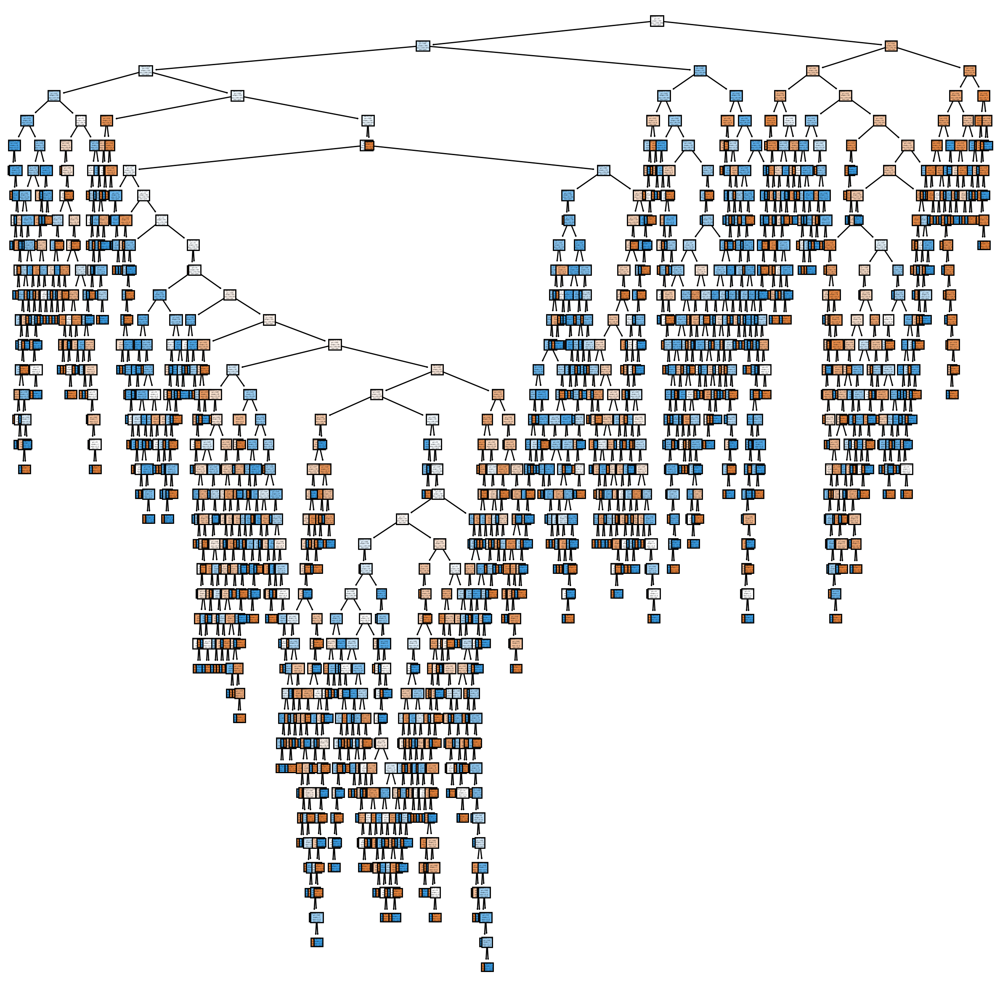

In [ ]:
# Визуализируем одно дерево из случайного леса - потому что в случайном лесу их много и как с решающим деревом тут не получится
plt.figure(figsize=(15, 15))
plot_tree(rf_two.estimators_[0], feature_names=best_features_two, class_names=['bad', 'good'], filled=True)
plt.show()


Это что то ужасное читать это невозможно, в целом отмечено чем хуже точность, тем более сложное дерево мы видим, это такой алгоритм который не хочет мирится с плохой точностью ему крайне необходимо все упорядочить по листам, отсюда и такая разветврелнная сложная система

2) визуализация

In [ ]:
# подключим библиотека которые способны справляться с такими вигуализациями лучше, посмотрим на их работу

from sklearn.tree import export_graphviz
import graphviz

# Выбираем одно дерево из случайного леса (например, первое)
tree = rf_two.estimators_[0]

# Экспортируем дерево в формат Graphviz
dot_data = export_graphviz(tree, out_file=None,
                           feature_names=best_features_two,
                           class_names=['bad', 'good'],
                           filled=True)

# Рисуем граф
graph = graphviz.Source(dot_data)
graph


In [ ]:
# ноутбуке сотреть тоже не оч удобно проще сохранить в картинку и смотреть потом отдельно, качество очень хорошее
graph.render("graphname", format="png")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.931172 to fit


'graphname.png'

In [ ]:
plt.rcParams["font.family"] = "Arial" # выходил варнинг на этот шрифт, но пофиксить его так и не удалось

In [ ]:
import warnings

# Выключаем предупреждения
warnings.filterwarnings('ignore')

In [ ]:
!apt-get install -y fonts-liberation

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-liberation is already the newest version (1:1.07.4-11).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


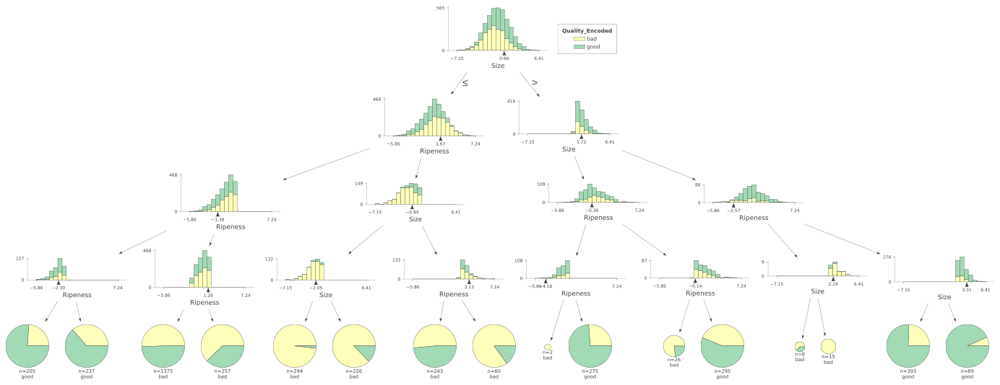

In [ ]:
#Я не нашел как визуализировать случайный лес этой библиотекой, ошибки которые возникали прямо указывали на то что это невозможно
# ну пусть это будет третья визуализация
X = df[best_features_two]
y = df['Quality_Encoded']

clf = DecisionTreeClassifier(max_depth=4)
clf.fit(X, y)

viz_model = dtreeviz.model(clf,
                           X_train=X, y_train=y,
                           feature_names= best_features_two,
                           target_name='Quality_Encoded',
                           class_names= ['bad', 'good'])

v = viz_model.view()     # render as SVG into internal object
v.show()                 # pop up window
v.save("rf.svg")  # optionally save as svg
viz_model.view()


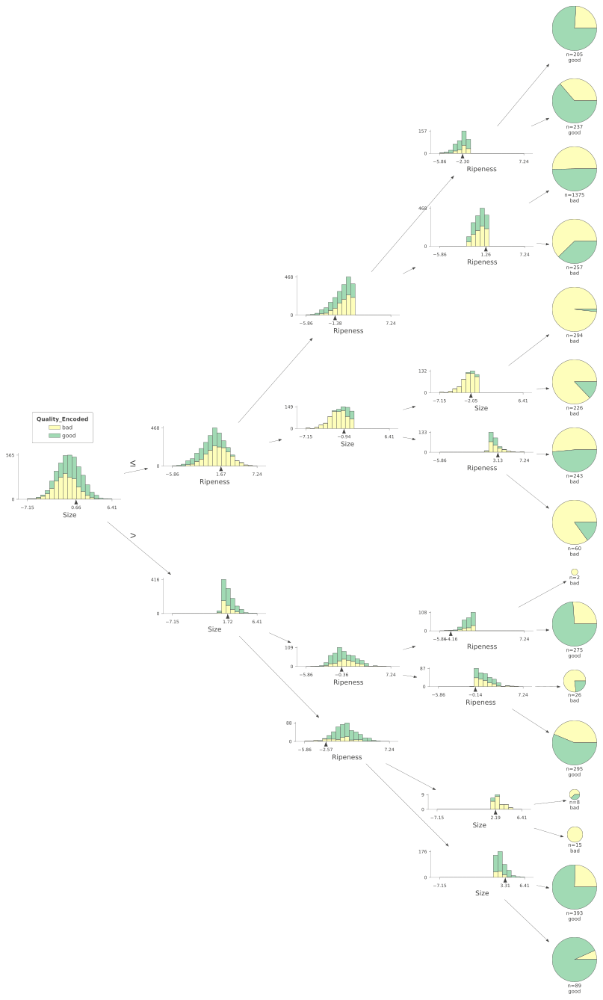

In [ ]:
viz_model.view(orientation="LR")

У меня не получилось реализовать красивые графики dtreeviz ни в colab ни на домашнем компьютере локально, поэтому буду выкручиваться и придумывать другие визуализации:)

4) визуализация

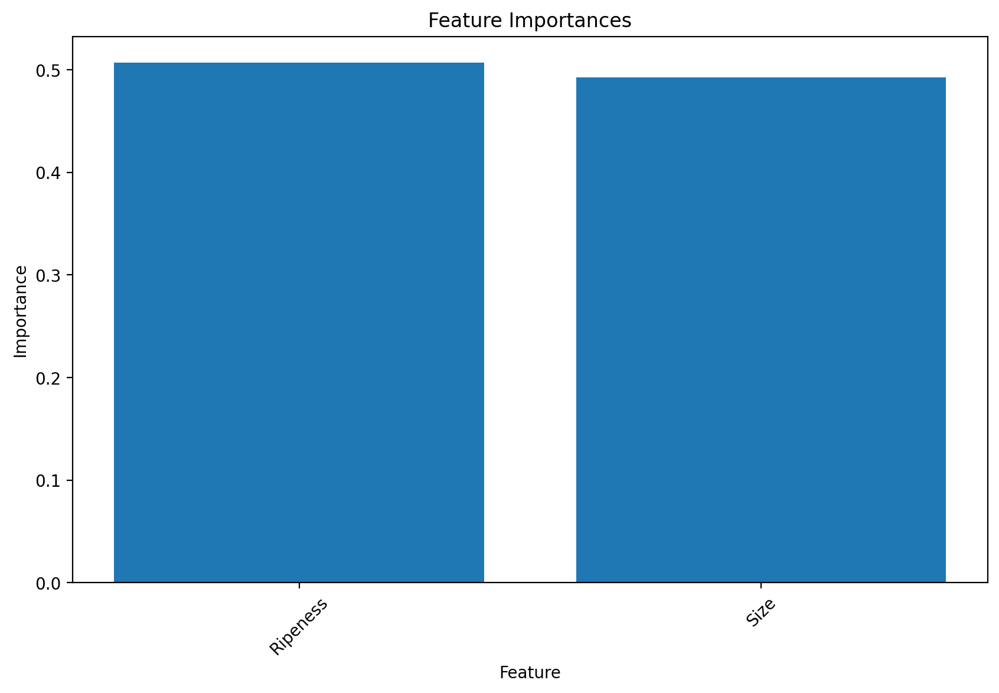

In [ ]:
# Получение важности признаков из обученного случайного леса
feature_importances = rf_two.feature_importances_

# Получение названий признаков
feature_names = best_features_two

# Сортировка признаков по их важности
sorted_indices = np.argsort(feature_importances)[::-1]
sorted_feature_importances = feature_importances[sorted_indices]
sorted_feature_names = np.array(feature_names)[sorted_indices]

# Визуализация важности признаков
plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_importances)), sorted_feature_importances, tick_label=sorted_feature_names)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.xticks(rotation=45)
plt.show()

## Задача 2.3 (1 балл)

Аналогично предыдущему пункту, создайте три трехмерных графика (или псевдотрехмерных — двумерных, где цветом отображено третье измерение) для того алгоритма случайного леса с тремя параметрами, который вы получили во втором пункте задачи 2.1.

Отмечу что все трехмерные визуализации достойные делаются dtreeviz, но он у меня почему то не хочет принимать на вход случайный лес, только решающий и еще несколько алгоритмов, поэтому я сначала сделаю задания для случайного леса, но визуализации будут не очень, а потому сделаю для решающего дерева

In [ ]:
# Отбираем данные с лучшими признаками
X_three = df[best_features_three]
y_three = df['Quality_Encoded']

# Создаем и обучаем лес
rf_three = RandomForestClassifier(n_estimators=100, random_state=42)
rf_three.fit(X_three, y_three)

RandomForestClassifier(random_state=42)

1) визуализация

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names


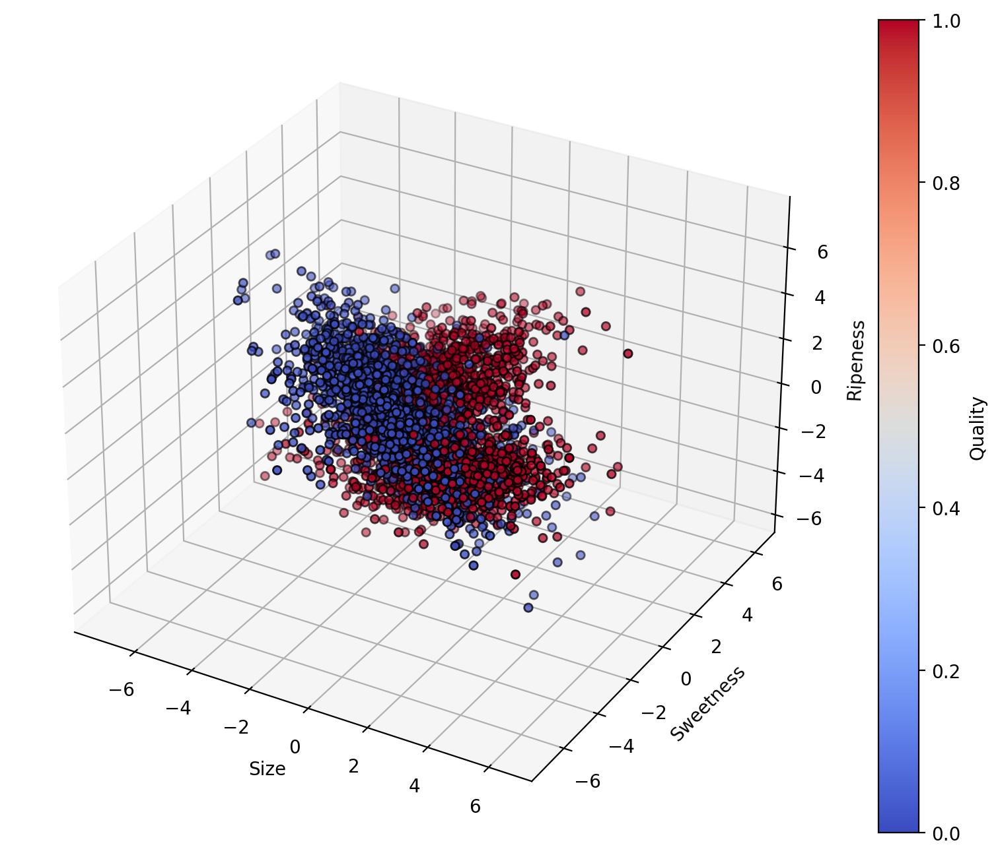

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# Создаем трехмерный график
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Создаем сетку значений для признаков
x_min, x_max = X_three.iloc[:, 0].min() - 1, X_three.iloc[:, 0].max() + 1
y_min, y_max = X_three.iloc[:, 1].min() - 1, X_three.iloc[:, 1].max() + 1
z_min, z_max = X_three.iloc[:, 2].min() - 1, X_three.iloc[:, 2].max() + 1
xx, yy, zz = np.meshgrid(np.arange(x_min, x_max, 0.1),
                         np.arange(y_min, y_max, 0.1),
                         np.arange(z_min, z_max, 0.1))

# Получаем предсказания для каждой точки в сетке
Z = rf_three.predict(np.c_[xx.ravel(), yy.ravel(), zz.ravel()])
Z = Z.reshape(xx.shape)

# Отображаем поверхность
scatter = ax.scatter(X_three.iloc[:, 0], X_three.iloc[:, 1], X_three.iloc[:, 2], c=y_three, cmap=plt.cm.coolwarm, s=20, edgecolor='k')
ax.set_xlabel(best_features_three[0])
ax.set_ylabel(best_features_three[1])
ax.set_zlabel(best_features_three[2])

# Добавляем легенду
legend = plt.colorbar(scatter)
legend.set_label('Quality')

plt.show()


2) вторая визуализация, довольно простое но интересное сочетание наших трех признаков в разрезе

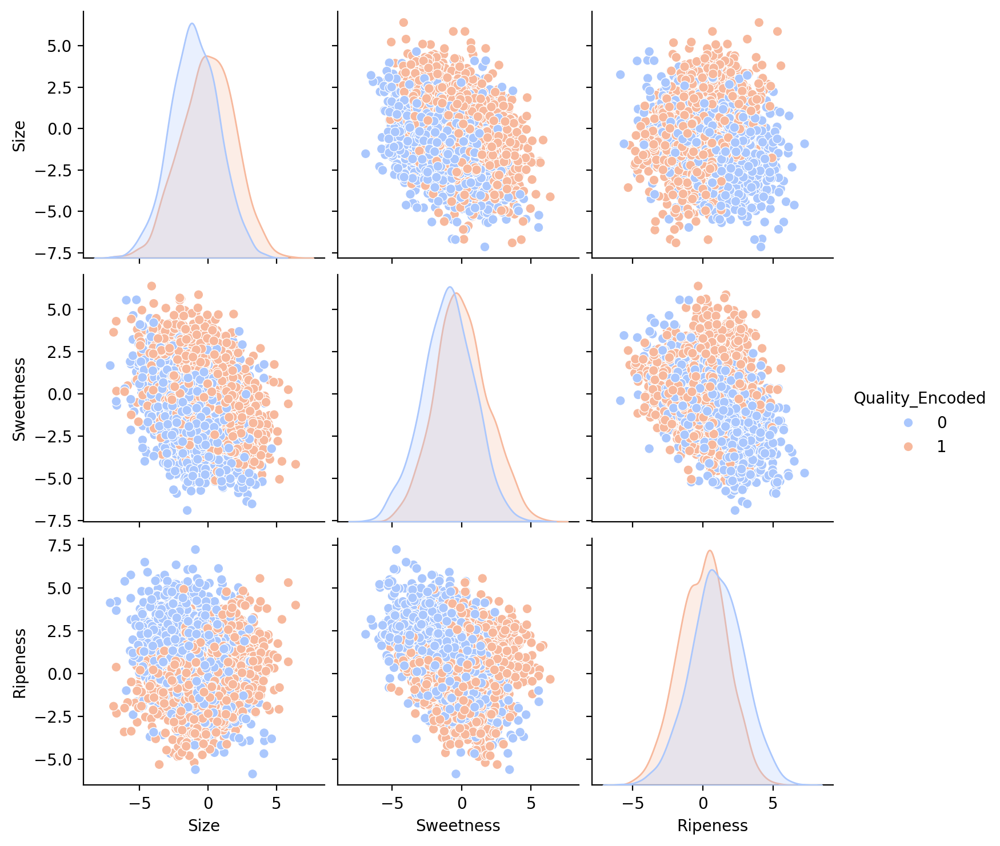

In [ ]:
# Объединяем признаки и целевую переменную в один DataFrame
df_plot_three = X_three.copy()
df_plot_three['Quality_Encoded'] = y_three

# Строим scatter plot с использованием Seaborn
sns.pairplot(df_plot_three, hue='Quality_Encoded', palette='coolwarm')
plt.show()

3) третий вариант это сочетание наших признаков в объемном просторанстве

<ipython-input-62-70b7ba14c284>:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


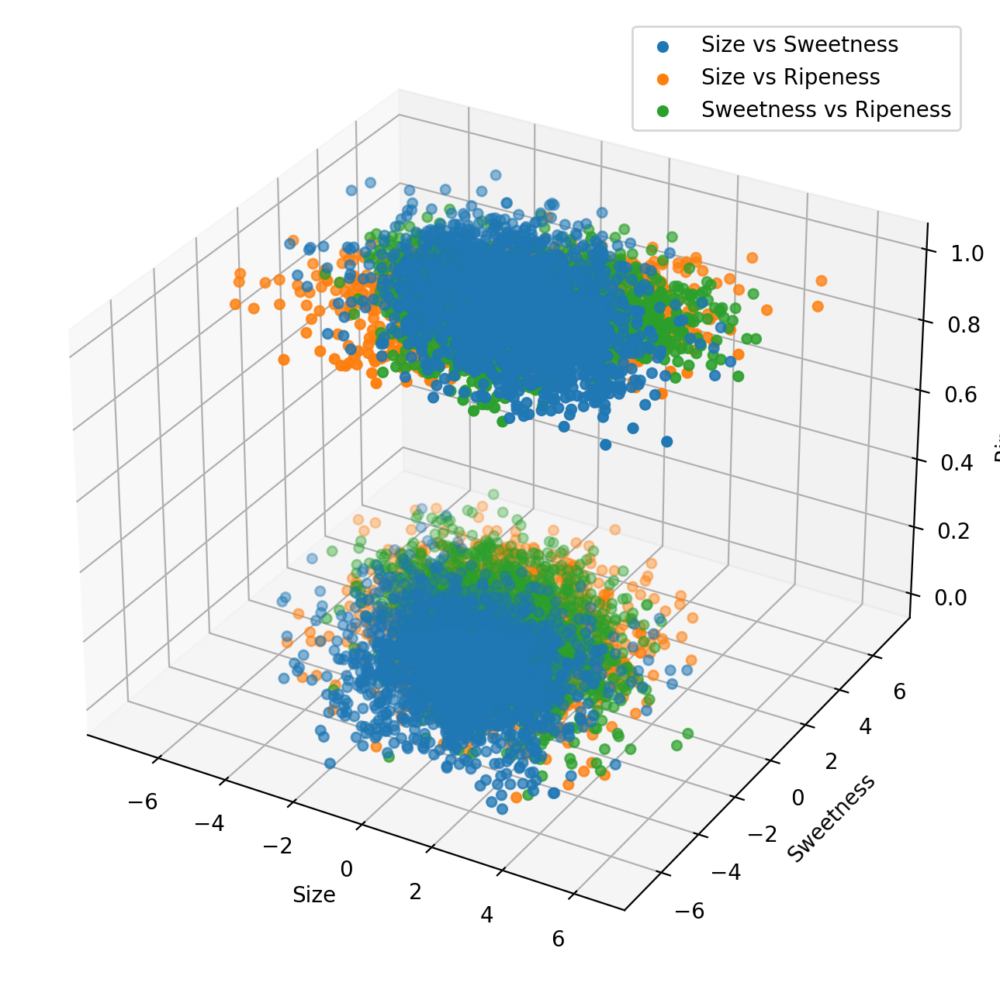

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

# Создаем трехмерный график
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Строим scatter plot для каждой комбинации признаков
for i in range(len(best_features_three)):
    for j in range(i+1, len(best_features_three)):
        ax.scatter(X_three.iloc[:, i], X_three.iloc[:, j], y_three, cmap='coolwarm', label=f'{best_features_three[i]} vs {best_features_three[j]}')

# Добавляем метки осей
ax.set_xlabel(best_features_three[0])
ax.set_ylabel(best_features_three[1])
ax.set_zlabel(best_features_three[2])

# Добавляем легенду
ax.legend()

plt.show()


Стоит обратить внимание на то какое сильное разделение у нас есть по позиции Ripeness, как бы образуются два полюса

Этот график шумовой, попробовал, но не очень информативно.

In [ ]:
import plotly.graph_objects as go
from sklearn import tree

# Получаем дерево решений из RandomForestClassifier
dtree = rf_three.estimators_[0]

# Создаем граф объектов для дерева
fig = go.Figure()

# Добавляем дерево решений на график
fig.add_trace(go.Scatter(
    x=dtree.tree_.feature,
    y=dtree.tree_.threshold,
    mode='markers',
    marker=dict(
        size=10,
        color=dtree.tree_.impurity,
        colorscale='Viridis',
        showscale=True
    ),
    text=['Feature: {}<br>Threshold: {}'.format(f, t) for f, t in zip(dtree.tree_.feature, dtree.tree_.threshold)],
    hoverinfo='text'
))

# Настраиваем оси и макет графика
fig.update_layout(
    title='Decision Tree Visualization',
    xaxis=dict(title='Feature Index'),
    yaxis=dict(title='Threshold'),
    showlegend=False
)

# Отображаем график
fig.show()


Теперь перейду к визуализации трех признаковых объемных графиков

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


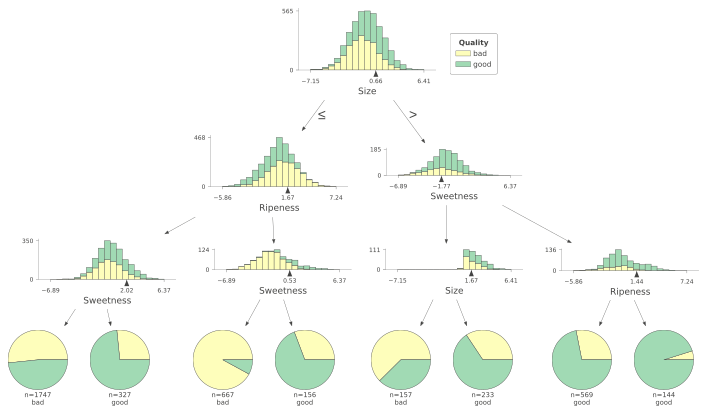

In [ ]:
# Отбираем данные с лучшими признаками
X_three = df[best_features_three]
y_three = df['Quality_Encoded']

# Создаем случайный лес
dfc_three = DecisionTreeClassifier(max_depth=3)
dfc_three.fit(X_three, y_three)

# Визуализируем агрегированную модель
viz_model = dtreeviz.model(dfc_three, X_three, y_three,
                           feature_names=best_features_three,
                           class_names=['bad', 'good'],
                           target_name='Quality')

viz_model.view()  # Отобразить


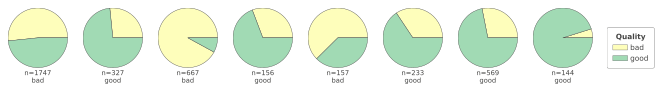

In [ ]:
viz_model.view(depth_range_to_display=(3, 4))

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


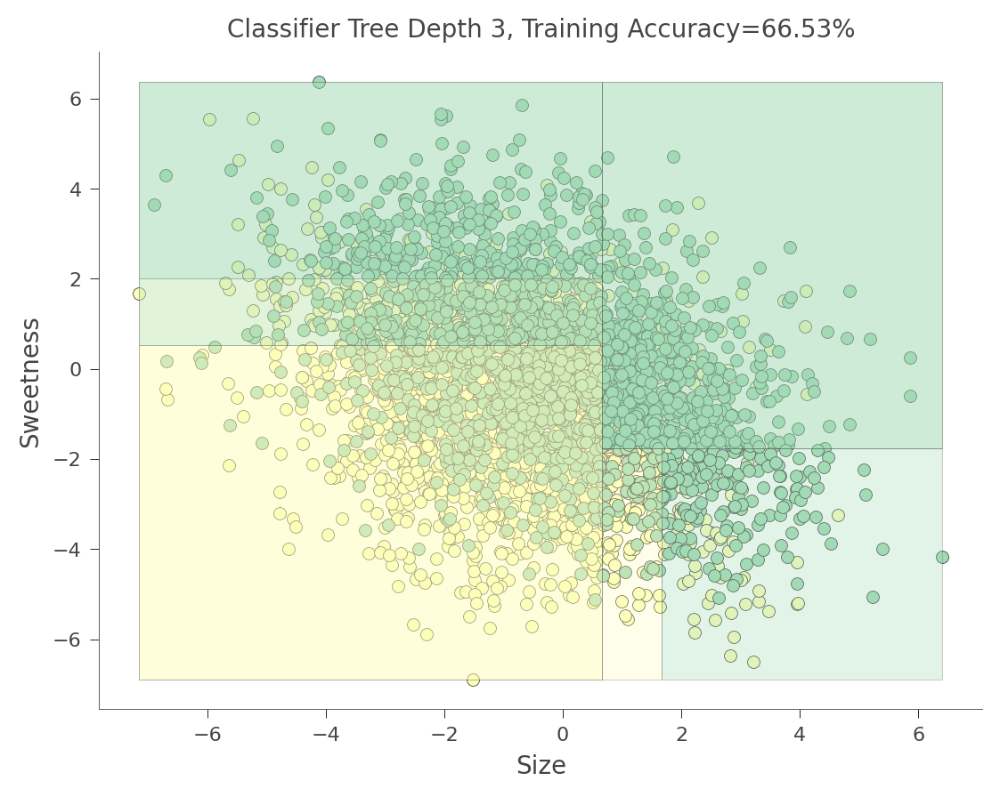

In [ ]:
viz_model.ctree_feature_space(show={'splits','title'}, features=['Size', 'Sweetness'])

А вот самый красивый обхемный график

In [ ]:
# Отбираем данные с лучшими признаками
X_three = df[best_features_three]
y_three = df['Quality_Encoded']

# Создаем случайный лес
dfc_three = DecisionTreeClassifier(max_depth=3)
dfc_three.fit(X_three, y_three)

DecisionTreeClassifier(max_depth=3)

In [ ]:
# Отображаем объемную визуализацию дерева решений
fig = go.Figure(data=go.Scatter3d(
    x=X_three.iloc[:, 0],
    y=X_three.iloc[:, 1],
    z=X_three.iloc[:, 2],
    mode='markers',
    marker=dict(
        size=5,
        color=y_three,
        colorscale='Viridis',
        opacity=0.8,
        colorbar=dict(title='Quality', tickvals=[0, 1], ticktext=['bad', 'good'])
    )
))

fig.update_layout(scene=dict(
    xaxis_title=best_features_three[0],
    yaxis_title=best_features_three[1],
    zaxis_title=best_features_three[2]
))

fig.show()


Полностью объемный и крутится, но по сути это сами данные а не результат работы дерева, самые красивые объемные графики в регрессорных деревьях, ну что же 1 и 0 это тоже числа поэтому чем не регрессия, построим

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names



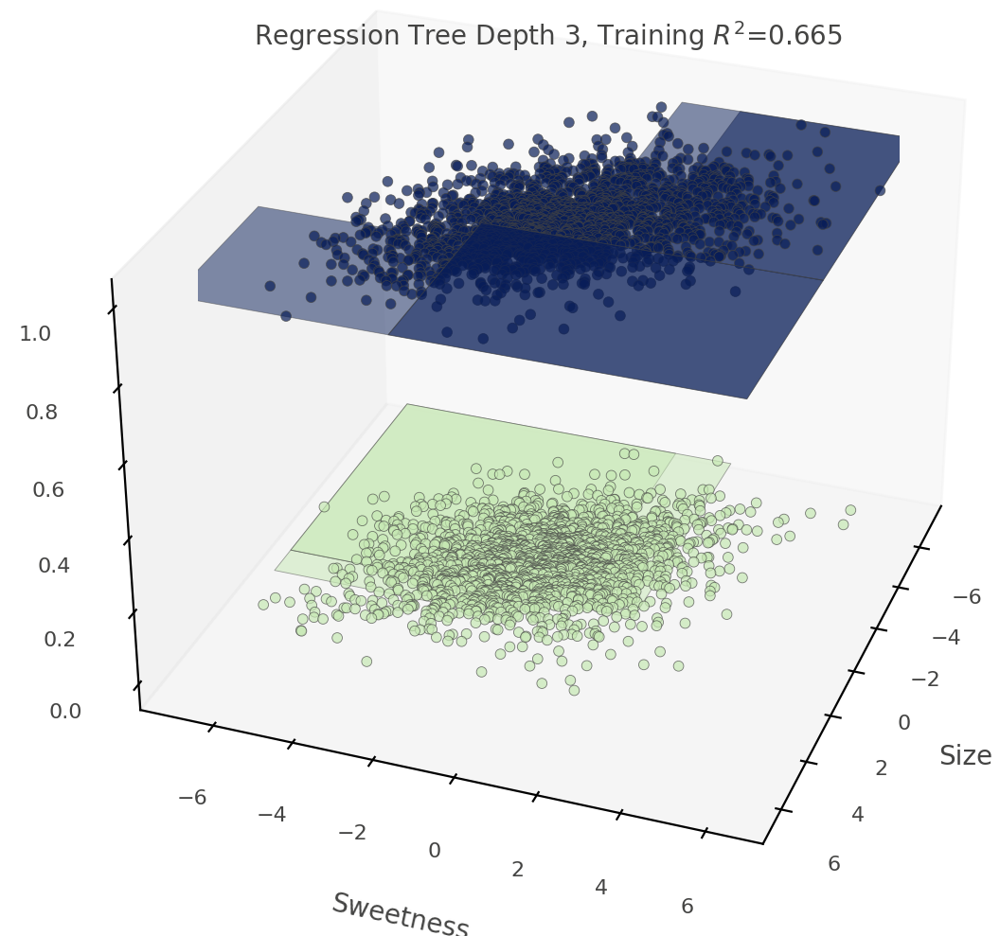

In [ ]:
viz_model.rtree_feature_space3D(features=['Size','Sweetness'],
                                 fontsize=10,
                                 elev=30, azim=20,
                                 show={'splits', 'title'},
                                 colors={'tessellation_alpha': .5})

К изучению таких графиков стоит привыкнуть, но мы видим что несладкие яблоки сразу попадают в плохие, равно как хорошими все таки считаются средние яблоки). Средние сладкие яблоки хорошие вот как наверное нужно читать этот график

# Задача 3.

Градиентный спуск для функции одной переменной (2 балла)
На занятиях мы разбирали создание визуализации алгоритмов градиентного спуска. Напишите с нуля свой алгоритм градиентного спуска. Создайте визуализацию работы градиентного спуска на каждой итерации для следующей функции:

Визуализацию снабдите названием, подписями к осям, а также добавьте текст с номером итерации (цвет выбирайте в зависимости от читаемости). Положение точки градиентного спуска на итерации n можно изобразить в качестве Scatter plot или Line plot.

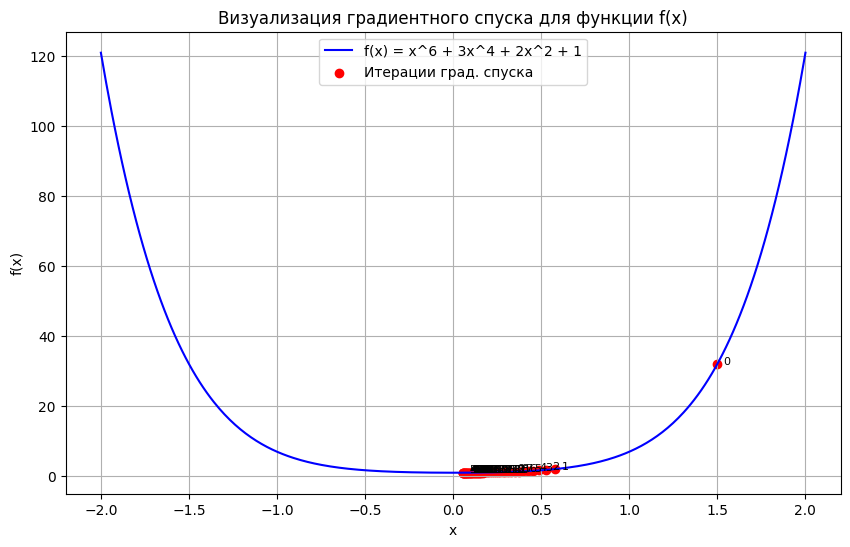

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def f(x):
    return x**6 + 3 * x**4 + 2 * x**2 + 1

def df(x):
    return 6 * x**5 + 12 * x**3 + 4 * x

def gradient_descent(starting_point, learning_rate, iterations):
    x = starting_point
    history = [x]
    for _ in range(iterations):
        gradient = df(x)
        x = x - learning_rate * gradient
        history.append(x)
    return np.array(history)

# Настройки для алгоритма градиентного спуска
starting_point = 1.5
learning_rate = 0.01
iterations = 50

# Запускаем градиентный спуск
history = gradient_descent(starting_point, learning_rate, iterations)

# Визуализация работы градиентного спуска
x_vals = np.linspace(-2, 2, 400)
y_vals = f(x_vals)

plt.figure(figsize=(10, 6))
plt.plot(x_vals, y_vals, label='f(x) = x^6 + 3x^4 + 2x^2 + 1', color='blue')
plt.scatter(history, f(np.array(history)), c='red', label='Итерации град. спуска')

for i, (x, y) in enumerate(zip(history, f(np.array(history)))):
    plt.text(x, y, f'  {i}', fontsize=8, color='black')

plt.xlabel('x')
plt.ylabel('f(x)')
plt.title('Визуализация градиентного спуска для функции f(x)')
plt.legend()
plt.grid(True)
plt.show()


В Plotly это можно реализовать красивее

In [ ]:
import numpy as np
import plotly.graph_objects as go

def f(x):
    return x**6 + 3 * x**4 + 2 * x**2 + 1

def df(x):
    return 6 * x**5 + 12 * x**3 + 4 * x

def gradient_descent(starting_point, learning_rate, iterations):
    x = starting_point
    history = [x]
    for _ in range(iterations):
        gradient = df(x)
        x = x - learning_rate * gradient
        history.append(x)
    return np.array(history)

# Настройки для алгоритма градиентного спуска
starting_point = 1.5
learning_rate = 0.01
iterations = 50

# Запускаем градиентный спуск
history = gradient_descent(starting_point, learning_rate, iterations)

# Визуализация работы градиентного спуска
x_vals = np.linspace(-2, 2, 400)
y_vals = f(x_vals)

# Создание интерактивного графика с помощью Plotly
fig = go.Figure()

# Добавляем график функции
fig.add_trace(go.Scatter(x=x_vals, y=y_vals, mode='lines', name='f(x) = x^6 + 3x^4 + 2x^2 + 1'))

# Добавляем точки градиентного спуска
for i, (x, y) in enumerate(zip(history, f(np.array(history)))):
    fig.add_trace(go.Scatter(x=[x], y=[y], mode='markers+text', marker=dict(color='red', size=8), text=[f'{i}'], textposition='bottom center'))

# Настройки макета
fig.update_layout(title='Визуализация градиентного спуска для функции f(x)',
                  xaxis_title='x',
                  yaxis_title='f(x)',
                  showlegend=False)

# Отображение графика
fig.show()


Хотел еще сделать с кнопкой и движенением, но времени не хватило

# Задача 4.

Визуализация градиентного спуска для трехмерной функции (4 балла)
В теории оптимизации есть достаточно известная функция Розенброка. Она используется для проверки производительности алгоритмов.

Постройте трехмерную визуализацию (plt.surface() или ее двумерные аналоги, например, plt.contourf()), работы градиентного спуска для функции Розенброка:

В качестве визуализации текущего расположения градиентного спуска лучше использовать линейный график красного цвета, чтобы отследить блуждания функции в трехмерном пространстве. Визуализацию снабдите названием, подписями к осям, а также добавьте текст с номером итерации (цвет выбирайте в зависимости от читаемости). Положение точки градиентного спуска на итерации n лучше изобразить через Line plot.

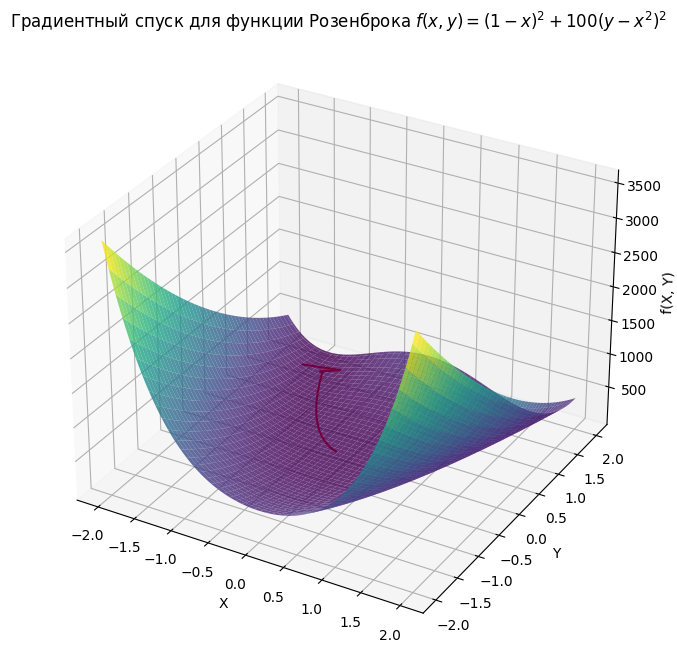

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Функция Розенброка
def rosenbrock(x, y):
    return (1 - x)**2 + 100 * (y - x**2)**2

# Градиент функции Розенброка
def rosenbrock_gradient(x, y):
    dx = -2 * (1 - x) - 400 * x * (y - x**2)
    dy = 200 * (y - x**2)
    return dx, dy

# Алгоритм градиентного спуска
def gradient_descent_rosenbrock(starting_point, learning_rate, iterations):
    x, y = starting_point
    history = [(x, y)]
    for _ in range(iterations):
        dx, dy = rosenbrock_gradient(x, y)
        x -= learning_rate * dx
        y -= learning_rate * dy
        history.append((x, y))
    return np.array(history)

# Настройки для алгоритма градиентного спуска
starting_point = [-1.5, 1.5]
learning_rate = 0.001
iterations = 1000

# Запуск алгоритма градиентного спуска
history = gradient_descent_rosenbrock(starting_point, learning_rate, iterations)

# Создание трехмерной визуализации
x_vals = np.linspace(-2, 2, 100)
y_vals = np.linspace(-2, 2, 100)
X, Y = np.meshgrid(x_vals, y_vals)
Z = rosenbrock(X, Y)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Поверхность функции Розенброка
ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8)  # Увеличиваем яркость функции

# Линейный график текущего расположения градиентного спуска
ax.plot(history[:, 0], history[:, 1], rosenbrock(history[:, 0], history[:, 1]), color='red')

# Настройки макета
ax.set_title('Градиентный спуск для функции Розенброка $f(x, y) = (1 - x)^2 + 100(y - x^2)^2$')
# Текстовая аннотация с формулой функции Розенброка
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('f(X, Y)')

plt.show()


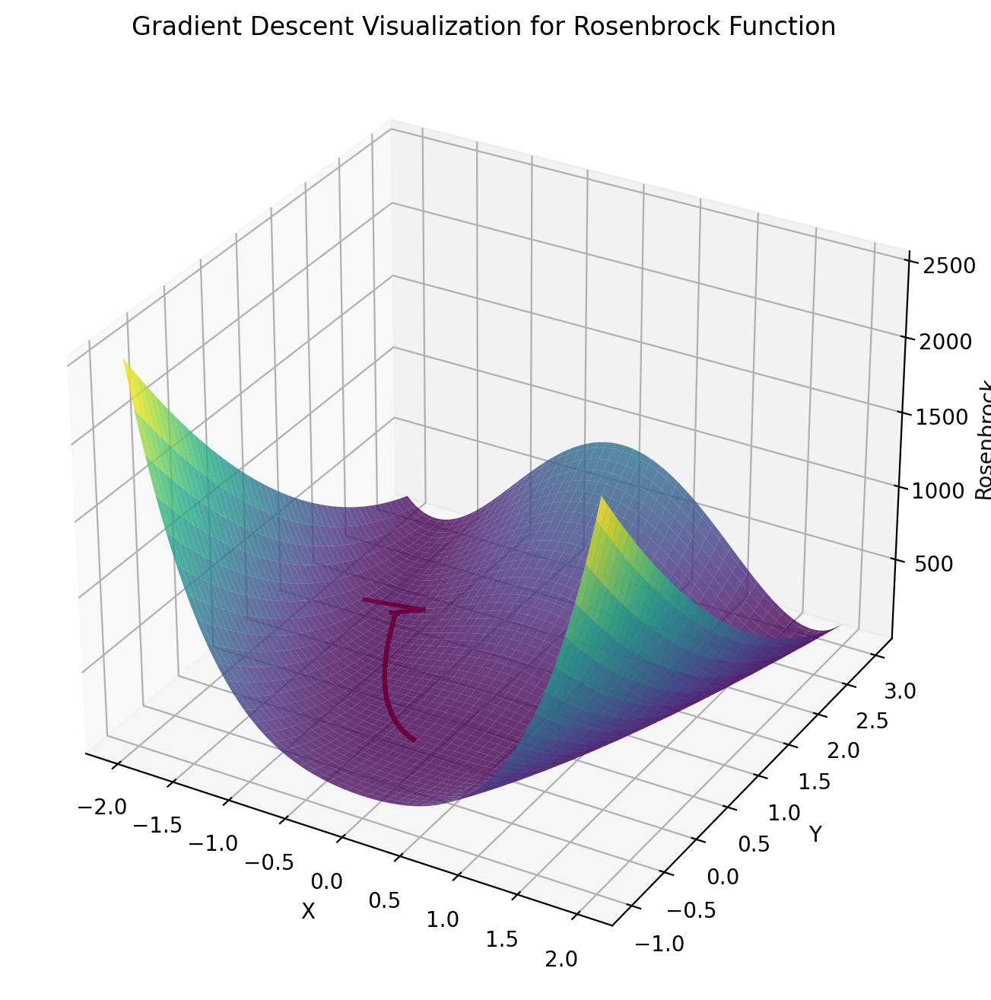

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Функция Розенброка
def rosenbrock(x, y):
    return (1 - x)**2 + 100 * (y - x**2)**2

# Производные функции Розенброка
def rosenbrock_grad(x, y):
    grad_x = -2 * (1 - x) - 400 * x * (y - x**2)
    grad_y = 200 * (y - x**2)
    return grad_x, grad_y

# Градиентный спуск
def gradient_descent(x_start, y_start, learning_rate, num_iterations):
    trajectory = [(x_start, y_start)]
    x, y = x_start, y_start
    for _ in range(num_iterations):
        grad_x, grad_y = rosenbrock_grad(x, y)
        x -= learning_rate * grad_x
        y -= learning_rate * grad_y
        trajectory.append((x, y))
    return trajectory

# Начальные условия для градиентного спуска
x_start, y_start = -1.5, 1.5
learning_rate = 0.001
num_iterations = 1000

# Вычисляем траекторию градиентного спуска
trajectory = gradient_descent(x_start, y_start, learning_rate, num_iterations)

# Создаем сетку значений для функции Розенброка
x = np.linspace(-2, 2, 100)
y = np.linspace(-1, 3, 100)
X, Y = np.meshgrid(x, y)
Z = rosenbrock(X, Y)

# Визуализация
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Поверхность функции Розенброка
ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8)

# Траектория градиентного спуска
for i in range(len(trajectory) - 1):
    x1, y1 = trajectory[i]
    x2, y2 = trajectory[i + 1]
    ax.plot([x1, x2], [y1, y2], [rosenbrock(x1, y1), rosenbrock(x2, y2)], color='red', linewidth=2)

# Добавляем подписи к осям
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Rosenbrock')

# Добавляем заголовок
plt.title('Gradient Descent Visualization for Rosenbrock Function')

plt.show()


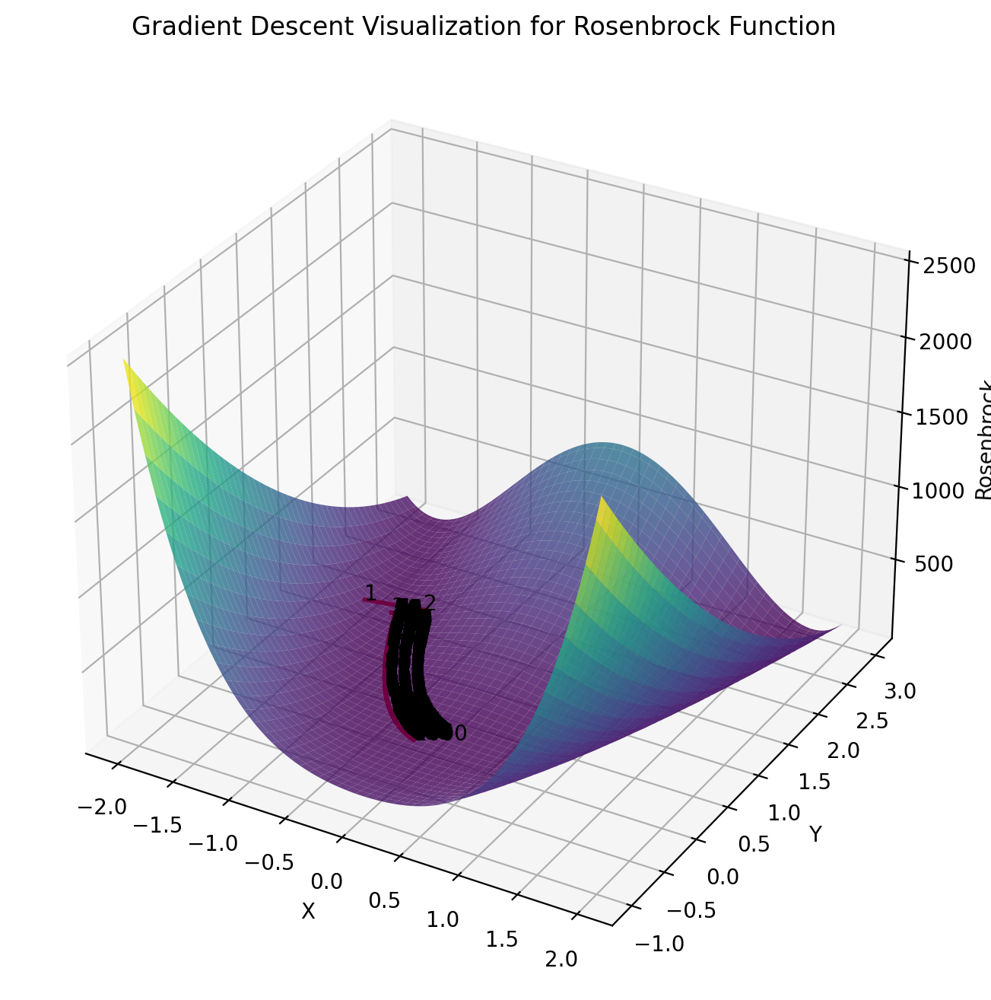

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Функция Розенброка
def rosenbrock(x, y):
    return (1 - x)**2 + 100 * (y - x**2)**2

# Производные функции Розенброка
def rosenbrock_grad(x, y):
    grad_x = -2 * (1 - x) - 400 * x * (y - x**2)
    grad_y = 200 * (y - x**2)
    return grad_x, grad_y

# Градиентный спуск
def gradient_descent(x_start, y_start, learning_rate, num_iterations):
    trajectory = [(x_start, y_start)]
    x, y = x_start, y_start
    for i in range(num_iterations):
        grad_x, grad_y = rosenbrock_grad(x, y)
        x -= learning_rate * grad_x
        y -= learning_rate * grad_y
        trajectory.append((x, y))
    return trajectory

# Начальные условия для градиентного спуска
x_start, y_start = -1.5, 1.5
learning_rate = 0.001
num_iterations = 1000

# Вычисляем траекторию градиентного спуска
trajectory = gradient_descent(x_start, y_start, learning_rate, num_iterations)

# Создаем сетку значений для функции Розенброка
x = np.linspace(-2, 2, 100)
y = np.linspace(-1, 3, 100)
X, Y = np.meshgrid(x, y)
Z = rosenbrock(X, Y)

# Визуализация
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Поверхность функции Розенброка
ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8)

# Траектория градиентного спуска
for i in range(len(trajectory) - 1):
    x1, y1 = trajectory[i]
    x2, y2 = trajectory[i + 1]
    ax.plot([x1, x2], [y1, y2], [rosenbrock(x1, y1), rosenbrock(x2, y2)], color='red', linewidth=2)
    ax.text(x1, y1, rosenbrock(x1, y1), f'{i+1}', color='black', fontsize=10)

# Добавляем подписи к осям
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Rosenbrock')

# Добавляем заголовок
plt.title('Gradient Descent Visualization for Rosenbrock Function')

plt.show()


некрасиво, лучше в plotly, там номер итерации подсветится при наведении на нее

In [ ]:
# Функция Розенброка
def rosenbrock(x, y):
    return (1 - x)**2 + 100 * (y - x**2)**2

# Производные функции Розенброка
def rosenbrock_grad(x, y):
    grad_x = -2 * (1 - x) - 400 * x * (y - x**2)
    grad_y = 200 * (y - x**2)
    return grad_x, grad_y

# Градиентный спуск
def gradient_descent(x_start, y_start, learning_rate, num_iterations):
    trajectory = [(x_start, y_start)]
    x, y = x_start, y_start
    for i in range(num_iterations):
        grad_x, grad_y = rosenbrock_grad(x, y)
        x -= learning_rate * grad_x
        y -= learning_rate * grad_y
        trajectory.append((x, y))
    return trajectory

# Начальные условия для градиентного спуска
x_start, y_start = 0, 1.5
learning_rate = 0.001
num_iterations = 1000

# Вычисляем траекторию градиентного спуска
trajectory = gradient_descent(x_start, y_start, learning_rate, num_iterations)

# Создаем сетку значений для функции Розенброка
x = np.linspace(-2, 2, 100)
y = np.linspace(-1, 3, 100)
X, Y = np.meshgrid(x, y)
Z = rosenbrock(X, Y)

# Визуализация
trace_surface = go.Surface(x=X, y=Y, z=Z, colorscale='Viridis', opacity=0.8)

# Траектория градиентного спуска
trace_trajectory = go.Scatter3d(
    x=[point[0] for point in trajectory],
    y=[point[1] for point in trajectory],
    z=[rosenbrock(point[0], point[1]) for point in trajectory],
    mode='lines+markers',
    line=dict(color='red', width=1),  # Уменьшаем толщину линии
    marker=dict(size=3),  # Уменьшаем размер точек
    name='Gradient Descent Trajectory',
    text=[f'Iteration: {i}' for i in range(num_iterations + 1)]
)

# Создание и отрисовка графика
fig = go.Figure(data=[trace_surface, trace_trajectory])

# Настройка макета графика
fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Rosenbrock',
    ),
    title='Gradient Descent Visualization for Rosenbrock Function'
)

# Отображение графика
fig.show()
